<a href="https://colab.research.google.com/github/safaiat/CT_EXP/blob/main/MBIR_Full_Safaiat/MBIR_TV_L2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 441.1/441.1 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.7/56.7 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.7/92.7 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.7/119.7 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 754.1/754.1 kB 15.7 MB/s eta 0:00:00


/usr/local/lib/python3.12/dist-packages/mbirjax/viewer.py:16: UserWarning: TkAgg not available for matplotlib. slice_viewer menus may not display correctly.
  warnings.warn("TkAgg not available for matplotlib. slice_viewer menus may not display correctly.")


Assembling A (no sparse formats)...


Building system matrix: 100%|██████████| 16384/16384 [00:22<00:00, 713.44col/s]


Packed A for dense scatter: rows=8192, cols=16384, nnz=1255034
Using device: cpu
Forward projecting ground-truth (Shepp–Logan mid slice only)...
Projection time: 0.024187803268432617 sec; Sinogram shape: (64, 40, 128)
Sinogram loaded successfully.
Starting MBIR Reconstruction (Shepp–Logan mid slice)...


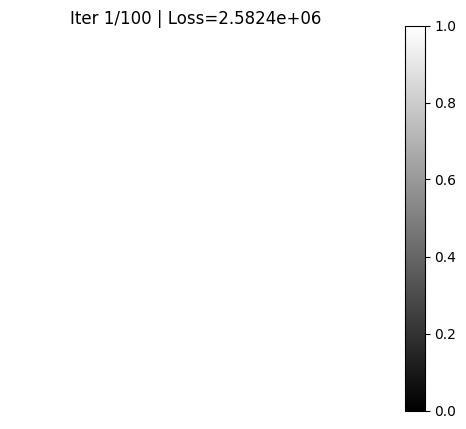

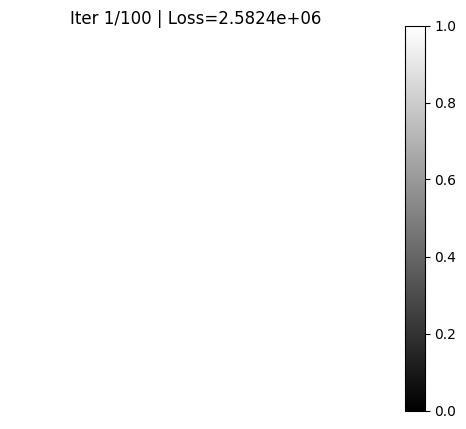

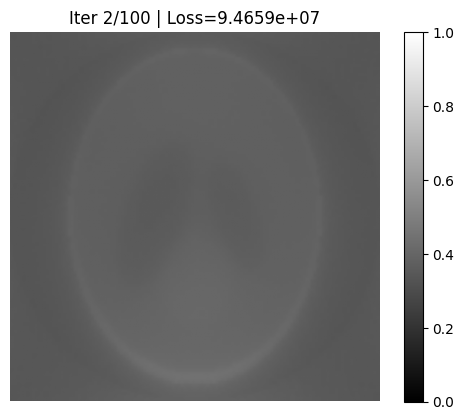

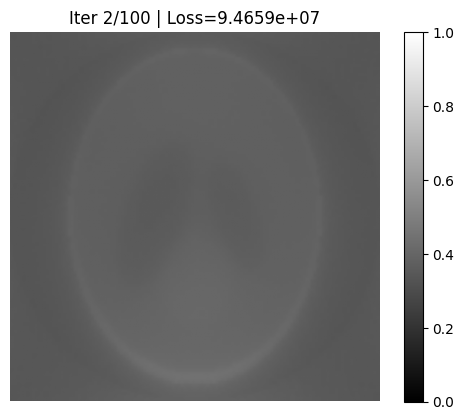

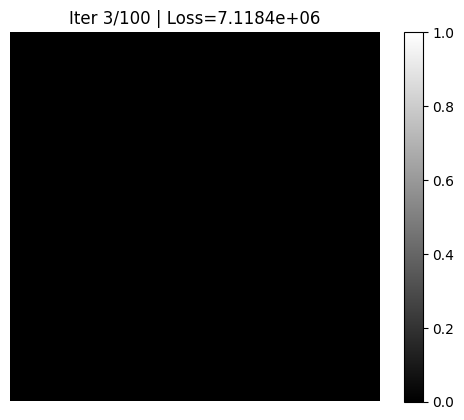

...

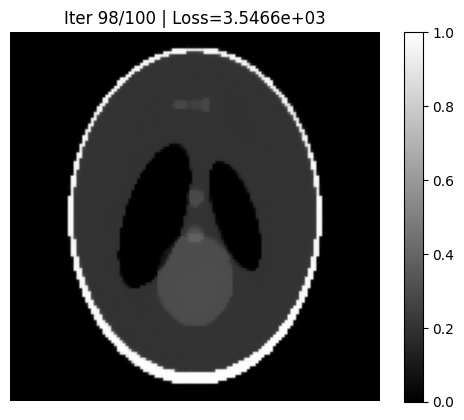

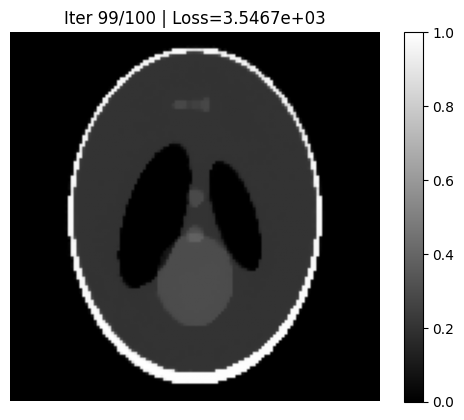

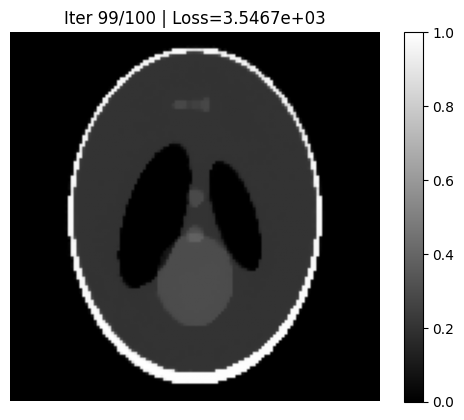

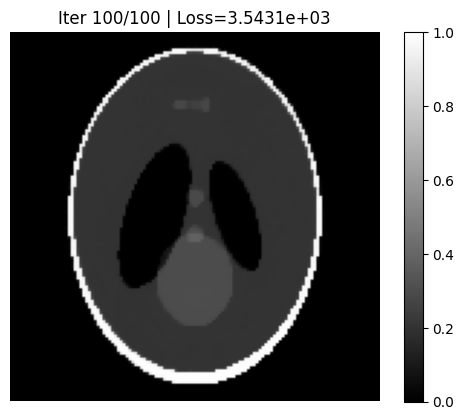

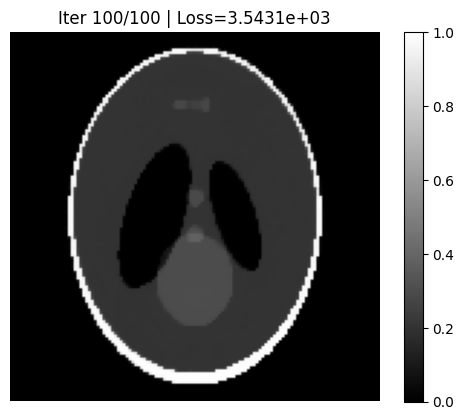

Reconstruction completed.
Reconstructed volume saved as mbir_reconstruction.npy


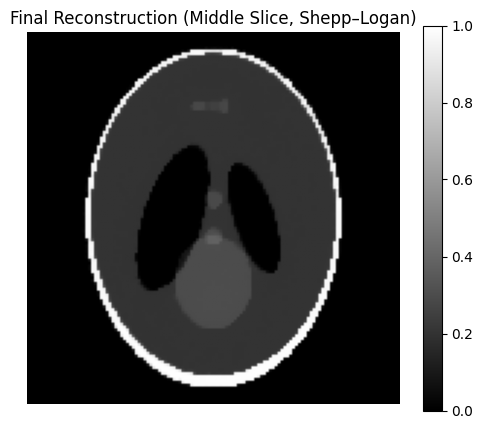

In [1]:
# ========================= ONE-CELL: A-matrix + MBIR (Shepp–Logan middle slice only) =========================
!pip install -q mbirjax

import math, time
import numpy as np
import torch
import jax.numpy as jnp
import mbirjax
import matplotlib.pyplot as plt
import torch.nn.functional as F
from tqdm import tqdm
from IPython.display import clear_output, display

# ---------------- A-MATRIX CODE (UNMODIFIED) ----------------
def build_params():
  imgparams = {
    "Nx": 128, "Ny": 128, "Nz": 40, "FirstSliceNumber": 0,
    "Deltaxy": 1.0, "DeltaZ": 1.0, "ROIRadius": 128.0
  }
  sinoparams = {
    "NViews": 64, "NChannels": 128, "NSlices": 40, "FirstSliceNumber": 0,
    "DeltaChannel": 1.0, "CenterOffset": 0.0, "DeltaSlice": 1.0, "ViewAngles": []
  }
  step_size = math.pi / sinoparams["NViews"]
  for i in range(sinoparams["NViews"]):
    sinoparams["ViewAngles"].append(i * step_size)
  return imgparams, sinoparams

imgparams, sinoparams = build_params()
LEN_PIX = 511

def pixel_center_from_index(j, imgparams):
    Nx = imgparams["Nx"]; Ny = imgparams["Ny"]; dxy = imgparams["Deltaxy"]
    jx = j % Nx
    jy = j // Nx
    x = (jx - (Nx - 1) / 2.0) * dxy
    y = (jy - (Ny - 1) / 2.0) * dxy
    return x, y

def detector_centers(sinoparams):
    N = sinoparams["NChannels"]; d = sinoparams["DeltaChannel"]; off = sinoparams["CenterOffset"]
    t_centers = [(i - ((N - 1) / 2.0) - off) * d for i in range(N)]
    return t_centers

def ComputePixelProfile3DParallel(sinoparams, imgparams, LEN_PIX, device=None, dtype=None):
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    if dtype is None:
        dtype = torch.float32
    NViews = int(sinoparams["NViews"])
    pix_prof = torch.zeros((NViews, int(LEN_PIX)), dtype=dtype, device=device)
    pi = math.pi
    rc = math.sin(pi/4.0)
    DeltaPix = float(imgparams["Deltaxy"])
    for i in range(NViews):
        ang = float(sinoparams["ViewAngles"][i])
        while ang >= pi/2.0: ang -= pi/2.0
        while ang < 0.0:     ang += pi/2.0
        if ang <= pi/4.0:
            maxval = DeltaPix / max(math.cos(ang), 1e-12)
        else:
            maxval = DeltaPix / max(math.cos(pi/2.0 - ang), 1e-12)
        d1 = rc * math.cos(pi/4.0 - ang)
        d2 = rc * abs(math.sin(pi/4.0 - ang))
        t_1 = 1.0 - d1; t_2 = 1.0 - d2; t_3 = 1.0 + d2; t_4 = 1.0 + d1
        for j in range(LEN_PIX):
            t = 2.0 * j / float(LEN_PIX)
            if (t <= t_1) or (t > t_4):
                val = 0.0
            elif t <= t_2:
                denom = (t_2 - t_1) if (t_2 - t_1) != 0.0 else 1e-12
                val = maxval * (t - t_1) / denom
            elif t <= t_3:
                val = maxval
            else:
                denom = (t_4 - t_3) if (t_4 - t_3) != 0.0 else 1e-12
                val = maxval * (t_4 - t) / denom
            pix_prof[i, j] = val
    return pix_prof

def channel_window_for_pixel(x, y, theta, DeltaPix, t0, DeltaChannel, NChannels):
    s0 = y*math.cos(theta) - x*math.sin(theta)
    t_min = s0 - DeltaPix
    t_max = s0 + DeltaPix
    i_min = math.ceil((t_min - t0) / DeltaChannel - 0.5)
    i_max = math.floor((t_max - t0) / DeltaChannel + 0.5)
    i_min = max(i_min, 0)
    i_max = min(i_max, NChannels - 1)
    return i_min, i_max, s0

def profile_index_for_channel(t_i, s0, DeltaPix, LEN_PIX):
    u_float = ((t_i - s0) + DeltaPix) * (LEN_PIX - 1) / (2.0 * DeltaPix)
    u = int(math.floor(u_float + 0.5))
    if u < 0: u = 0
    elif u >= LEN_PIX: u = LEN_PIX - 1
    return u

def sample_profile(pix_prof, view_idx, u_idx):
    return float(pix_prof[view_idx, u_idx].item())

def compute_sysmatrix_column(j, imgparams, sinoparams, pix_prof, t_centers, LEN_PIX):
    Nx = imgparams["Nx"]; Ny = imgparams["Ny"]; DeltaPix = imgparams["Deltaxy"]
    NViews = sinoparams["NViews"]; NChannels = sinoparams["NChannels"]
    DeltaChannel = sinoparams["DeltaChannel"]; ViewAngles = sinoparams["ViewAngles"]
    t0 = t_centers[0]
    x, y = pixel_center_from_index(j, imgparams)
    rows, vals = [], []
    for p in range(NViews):
        theta = ViewAngles[p]
        i_min, i_max, s0 = channel_window_for_pixel(x, y, theta, DeltaPix, t0, DeltaChannel, NChannels)
        if i_min > i_max: continue
        for i in range(i_min, i_max + 1):
            u = profile_index_for_channel(t_centers[i], s0, DeltaPix, LEN_PIX)
            w = sample_profile(pix_prof, p, u)
            if w > 0.0:
                rows.append(p * NChannels + i)
                vals.append(w)
    return rows, vals

def assemble_sysmatrix(imgparams, sinoparams, LEN_PIX):
    t_centers = detector_centers(sinoparams)
    pix_prof = ComputePixelProfile3DParallel(sinoparams, imgparams, LEN_PIX=LEN_PIX)
    Nx = imgparams["Nx"]; Ny = imgparams["Ny"]
    Ncols = Nx * Ny
    columns = [None] * Ncols
    for j in tqdm(range(Ncols), desc="Building system matrix", unit="col"):
        rows, vals = compute_sysmatrix_column(j, imgparams, sinoparams, pix_prof, t_centers, LEN_PIX)
        columns[j] = {"row_idx": rows, "val": vals}
    return {"Ncolumns": Ncols, "columns": columns}

print("Assembling A (no sparse formats)...")
A_dict = assemble_sysmatrix(imgparams, sinoparams, LEN_PIX)

# --------- Pack A into flat tensors (still NOT using torch.sparse) ---------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
Nrows = sinoparams["NViews"] * sinoparams["NChannels"]
Ncols = imgparams["Nx"] * imgparams["Ny"]

row_idx_all, col_idx_all, val_all = [], [], []
for c, col in enumerate(A_dict["columns"]):
    r = col["row_idx"]; v = col["val"]
    if len(r) == 0: continue
    row_idx_all.extend(r)
    col_idx_all.extend([c] * len(r))
    val_all.extend(v)

row_idx_all = torch.tensor(row_idx_all, dtype=torch.long, device=device)
col_idx_all = torch.tensor(col_idx_all, dtype=torch.long, device=device)
val_all     = torch.tensor(val_all,     dtype=torch.float32, device=device)
print(f"Packed A for dense scatter: rows={Nrows}, cols={Ncols}, nnz={row_idx_all.numel()}")

# ---------------- Shepp–Logan 2D phantom (modified) ----------------
def modified_shepp_logan_2d(H, W, dtype=np.float32):
    """
    Return a (H,W) modified Shepp–Logan phantom.
    Ellipse params: (I, a, b, x0, y0, phi_deg) in normalized coords x,y in [-1,1].
    """
    # Standard "modified" parameters (like skimage.data.shepp_logan_phantom but no dependency)
    ellipses = [
        ( 1.0, .6900, .920,   0.0,   0.0,   0),   # big head
        (-0.8, .6624, .874,   0.0,  -0.0184, 0), # skull
        (-0.2, .1100, .310,   0.22,  0.0,  -18),
        (-0.2, .1600, .410,  -0.22,  0.0,   18),
        ( 0.1, .2100, .250,   0.0,   0.35,  0),
        ( 0.1, .0460, .046,   0.0,   0.1,   0),
        ( 0.1, .0460, .046,   0.0,  -0.1,   0),
        ( 0.1, .0460, .023,  -0.08, -0.605, 0),
        ( 0.1, .0230, .023,   0.0,  -0.606, 0),
        ( 0.1, .0230, .046,   0.06, -0.605, 0),
    ]
    y, x = np.meshgrid(np.linspace(-1,1,H,dtype=dtype), np.linspace(-1,1,W,dtype=dtype), indexing='ij')
    img = np.zeros((H,W), dtype=dtype)
    for I, a, b, x0, y0, phi in ellipses:
        ang = np.deg2rad(phi)
        cos, sin = np.cos(ang), np.sin(ang)
        xr =  (x - x0)*cos + (y - y0)*sin
        yr = -(x - x0)*sin + (y - y0)*cos
        mask = ((xr/a)**2 + (yr/b)**2) <= 1.0
        img[mask] += I
    # Normalize to [0,1] (optional, but makes display/TV scale predictable)
    img = img - img.min()
    if img.max() > 0: img = img / img.max()
    return img.astype(dtype)

# ---------------- MBIR PART (middle-slice-only compute) ----------------
if torch.cuda.is_available():
    torch.cuda.set_device(0)
print(f"Using device: {device}")

num_views = sinoparams["NViews"]
num_det_rows = sinoparams["NSlices"]         # 40
num_det_channels = sinoparams["NChannels"]   # 128
geometry_type = "parallel"
angles = jnp.linspace(-np.pi / 2, np.pi / 2, num_views, endpoint=False)

# CT model setup (we won't use its phantom)
if geometry_type == "parallel":
    _ = mbirjax.ParallelBeamModel((num_views, num_det_rows, num_det_channels), angles)
else:
    raise ValueError("Invalid geometry type. Expected parallel.")

# Build Shepp–Logan ONLY in the middle slice
recon_shape = (num_det_channels, num_det_channels, num_det_rows)  # (H,W,D) = (128,128,40)
H, W, D = recon_shape
phantom2d = modified_shepp_logan_2d(H, W).astype(np.float32)
phantom_vol = torch.zeros(recon_shape, dtype=torch.float32, device=device)
mid_z = D // 2
phantom_vol[:, :, mid_z] = torch.tensor(phantom2d, device=device)
np.save("phantom.npy", phantom_vol.detach().cpu().numpy())

# ---------- Projector: compute only middle slice ----------
def sparse_forward_project(voxel_values, indices, sinogram_shape, recon_shape, angles_tensor):
    """
    Middle-slice-only projection using one vectorized index_add_.
    Returns (num_views, Nz, num_det_channels), with only mid slice filled.
    """
    num_views, Nz, num_det_channels = sinogram_shape
    Nrows = num_views * num_det_channels
    Ncols_expected = recon_shape[0] * recon_shape[1]  # H*W

    # Ensure (Ncols, Nz)
    if voxel_values.dim() == 1:
        voxel_values = voxel_values.view(Ncols_expected, 1)
    elif voxel_values.shape[0] != Ncols_expected:
        voxel_values = voxel_values.view(Ncols_expected, -1)

    y = torch.zeros((num_views, Nz, num_det_channels), dtype=torch.float32, device=device)
    mid = Nz // 2
    x_mid = voxel_values[:, mid]                              # (Ncols,)
    yz = torch.zeros(Nrows, dtype=torch.float32, device=device)
    yz.index_add_(0, row_idx_all, val_all * x_mid[col_idx_all])  # vectorized accumulation
    y[:, mid, :] = yz.view(num_views, num_det_channels)
    return y

# ---------- Make sinogram from Shepp–Logan middle slice ----------
sinogram_shape = (num_views, num_det_rows, num_det_channels)
angles_torch = torch.linspace(0, torch.pi, steps=num_views, device=device)

indices = torch.arange(recon_shape[0] * recon_shape[1], dtype=torch.int32, device=device)  # (H*W,)
voxel_values = phantom_vol.reshape((-1,) + recon_shape[2:])[indices]  # (H*W, D)

print("Forward projecting ground-truth (Shepp–Logan mid slice only)...")
t0 = time.time()
sinogram = sparse_forward_project(voxel_values, indices, sinogram_shape, recon_shape, angles_torch)
print("Projection time:", time.time() - t0, "sec; Sinogram shape:", tuple(sinogram.shape))

# Save/load for parity with your workflow
np.savez("sinogram_data.npz", sinogram=sinogram.detach().cpu().numpy(), angles=angles_torch.cpu().numpy())
data = np.load("sinogram_data.npz")
y = torch.tensor(data["sinogram"], dtype=torch.float32, device=device)
angles_torch = torch.tensor(data["angles"], dtype=torch.float32, device=device)
print("Sinogram loaded successfully.")

# ---------- TV on middle slice only (faster) ----------
def tv_mid_slice(x):
    eps = 1e-8
    z = x.shape[2] // 2
    s = x[:, :, z].unsqueeze(0).unsqueeze(0)  # (1,1,H,W)
    v = s[:, :, 1:, :] - s[:, :, :-1, :]
    h = s[:, :, :, 1:] - s[:, :, :, :-1]
    v = F.pad(v, (0,0,0,1))
    h = F.pad(h, (0,1,0,0))
    return torch.sum(torch.sqrt(torch.clamp(v**2 + h**2, min=eps)))

# ---------- Loss (projects & penalizes only middle slice) ----------
x_init = torch.zeros(recon_shape, dtype=torch.float32, requires_grad=True, device=device)

def loss_fn(x):
    Ax = sparse_forward_project(
        x.reshape(-1, recon_shape[2]),
        torch.arange(x.numel() // recon_shape[2], dtype=torch.int32, device=device),
        sinogram_shape, recon_shape, angles_torch
    )
    fidelity_term = torch.sum((y - Ax) ** 2)
    tv_term = tv_mid_slice(x)  # middle slice only
    return fidelity_term + 5 * tv_term

# ---------- Optimizer + Scheduler ----------
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR
optimizer = optim.Adam([x_init], lr=1.0)
scheduler = StepLR(optimizer, step_size=100, gamma=0.1)

# ---------- Training loop: 100 iters, plot middle slice every iter ----------
num_iterations = 100
print("Starting MBIR Reconstruction (Shepp–Logan mid slice)...")
plt.figure(figsize=(6,5))
for i in range(num_iterations):
    optimizer.zero_grad()
    loss = loss_fn(x_init)
    loss.backward()
    optimizer.step()
    scheduler.step()
    with torch.no_grad():
        x_init.clamp_(min=0)

    # Live plot of the middle slice
    #clear_output(wait=True)
    mid = recon_shape[2] // 2
    plt.imshow(x_init.detach().cpu().numpy()[:, :, mid], cmap="gray", vmin=0, vmax=1)
    plt.title(f"Iter {i+1}/{num_iterations} | Loss={loss.item():.4e}")
    plt.axis("off"); plt.colorbar()
    display(plt.gcf())
    plt.pause(0.001)

print("Reconstruction completed.")
np.save("mbir_reconstruction.npy", x_init.detach().cpu().numpy())
print("Reconstructed volume saved as mbir_reconstruction.npy")

# Final display
plt.figure(figsize=(6,5))
plt.imshow(x_init.detach().cpu().numpy()[:, :, mid], cmap="gray", vmin=0, vmax=1)
plt.title("Final Reconstruction (Middle Slice, Shepp–Logan)")
plt.axis("off"); plt.colorbar(); plt.show()
# ==============================================================================================================
